## IMPORTING LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.datasets import make_blobs


### Defining Functions and config vars

In [47]:
def check_outliers_std_dev(df, vars_without_outliers):
  df_no_out = df.copy()
  """Finds outliers with std dev method.It gets the df and a list of variables that dont 
  have outliers (categorical and binary vars) and returns a dictionary with the total number of outliers
  and the index of them for each var that HAS outliers
  """
  outliers = dict()
  for column in df.columns:
    if column in vars_without_outliers:
      continue
    else:
      mean = np.mean(df_no_out[column], axis=0)
      sd = np.std(df_no_out[column], axis=0)

      
      lower,upper =  mean - 3 * sd,  mean + 3 * sd
      outliers_index = (df_no_out[column] < lower) | (df_no_out[column] > upper)
      df_no_out = df_no_out[~outliers_index]
      if len(outliers_index == True) == 0:
        continue
      else:
        output = {
            "indexes" : outliers_index,
            "quantity" : outliers_index.sum(axis = 0)
        }
        outliers[column] = output
  return outliers, df_no_out

def outliers_printer(df, vars_list):
  i=1
  plt.figure(figsize = (20,10))
  for col in vars_list:
   
    plt.subplot(3,3,i)
    sns.boxplot(df[col])

    i=i+1

## STEP 1. EXPLORING AND UNDERSTANDING THE DATA SET

In [7]:
# Naming the data set
df = pd.read_csv('/Users/mariapintosrelat/Desktop/Data_Science_DSDM/Computational_Machine_Learning/Clustering_Assignment/retail_data - retail_data.csv')
df_copy = df.copy()
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,09-12-2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,09-12-2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,09-12-2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,09-12-2011 12:50,4.15,12680.0,France


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [4]:
df.nunique()

InvoiceNo      25900
StockCode       4070
Description     4211
Quantity         722
InvoiceDate    23260
UnitPrice       1630
CustomerID      4372
Country           38
dtype: int64

In [5]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [6]:
# Checking the ratio of null values present in every variable
pd.DataFrame(data = [df.isna().sum()/df.shape[0]*100],
             index=["Null (%)"]).T.style.background_gradient(cmap='summer_r')

,Null (%)
InvoiceNo,0.000000
StockCode,0.000000
Description,0.268311
Quantity,0.000000
InvoiceDate,0.000000
UnitPrice,0.000000
CustomerID,24.926694
Country,0.000000


In [14]:
# Checking the distribution for the numerical variables --> abans d'anàlisi numeriques
trace1 = go.Box(x=df['UnitPrice'],name='UnitPrice')
trace2 = go.Box(x=df['Quantity'], name='Quantity')


fig = make_subplots(rows=8, cols=1)
fig.append_trace(trace1, row = 1, col = 1)
fig.append_trace(trace2, row = 2, col = 1)


fig.update_layout(
    autosize=False,
    width=500,
    height=300,
    title_text = 'Distribution of numerical variables',
    title_x=0.5,
    title_font_size=20)

fig.show()

In [29]:
# Creating new column for 'YearOfSale'
df_copy['YearOfSale'] = pd.DatetimeIndex(df_copy['InvoiceDate']).year
df_copy

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,YearOfSale
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 8:26,2.55,17850.0,United Kingdom,2010
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 8:26,3.39,17850.0,United Kingdom,2010
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 8:26,2.75,17850.0,United Kingdom,2010
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 8:26,3.39,17850.0,United Kingdom,2010
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 8:26,3.39,17850.0,United Kingdom,2010
...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,09-12-2011 12:50,0.85,12680.0,France,2011
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,09-12-2011 12:50,2.10,12680.0,France,2011
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,09-12-2011 12:50,4.15,12680.0,France,2011
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,09-12-2011 12:50,4.15,12680.0,France,2011


In [30]:
df_copy.groupby(['YearOfSale'])['Quantity'].sum()

YearOfSale
2010     343197
2011    4967605
Name: Quantity, dtype: int64

<AxesSubplot:xlabel='YearOfSale'>

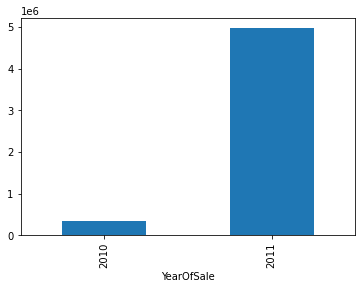

In [31]:
# Visutalising the distribution of Quantity through Year of Sale
df_copy.groupby(['YearOfSale'])['Quantity'].sum().plot(kind='bar')

In [32]:
df_copy.groupby(['Country'])['Quantity'].sum().sort_values(ascending=False)[:5]

Country
United Kingdom    4399357
Netherlands        199552
EIRE               142363
Germany            117446
France             110479
Name: Quantity, dtype: int64

<AxesSubplot:xlabel='Country'>

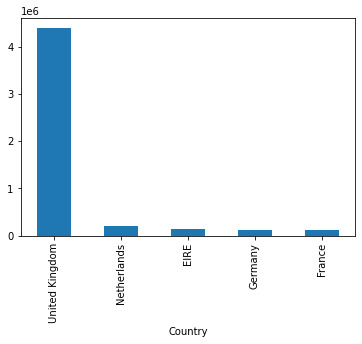

In [33]:
# Visutalising the distribution of Quantity through the 5 top different countries
df_copy.groupby(['Country'])['Quantity'].sum().sort_values(ascending=False)[:5].plot(kind='bar')

### Analysing UnitPrice variable

In [9]:
# Cases in which price < 0:
df[df.UnitPrice<0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
299983,A563186,B,Adjust bad debt,1,12-08-2011 14:51,-11062.06,NaN,United Kingdom
299984,A563187,B,Adjust bad debt,1,12-08-2011 14:52,-11062.06,NaN,United Kingdom


We can see that in these two cases, the UnitPrice is negative in order to adjust bad debt. We are going to eliminate these two rows since this is not relevant for our analysis

In [10]:
# Cases in which price = 0:
df[df.UnitPrice==0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,01-12-2010 11:52,0.0,NaN,United Kingdom
1970,536545,21134,NaN,1,01-12-2010 14:32,0.0,NaN,United Kingdom
1971,536546,22145,NaN,1,01-12-2010 14:33,0.0,NaN,United Kingdom
1972,536547,37509,NaN,1,01-12-2010 14:33,0.0,NaN,United Kingdom
1987,536549,85226A,NaN,1,01-12-2010 14:34,0.0,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
536981,581234,72817,NaN,27,08-12-2011 10:33,0.0,NaN,United Kingdom
538504,581406,46000M,POLYESTER FILLER PAD 45x45cm,240,08-12-2011 13:58,0.0,NaN,United Kingdom
538505,581406,46000S,POLYESTER FILLER PAD 40x40cm,300,08-12-2011 13:58,0.0,NaN,United Kingdom
538554,581408,85175,NaN,20,08-12-2011 14:06,0.0,NaN,United Kingdom


We are also going to drop those cases where price = 0.

In [19]:
#Keeping only positive prices:
df1 = df[df.UnitPrice >0]
df1.describe()

,Quantity,UnitPrice,CustomerID
count,539392.000000,539392.000000,406789.000000
mean,9.845904,4.673648,15287.795830
std,215.412652,94.614722,1713.573064
min,-80995.000000,0.001000,12346.000000
25%,1.000000,1.250000,13954.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


### Analysing Quantity variable

In [13]:
# Cases in which quantity < 0 and price > 0 (already filtered):
df1[df1.Quantity<0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,01-12-2010 9:41,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,01-12-2010 9:49,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,01-12-2010 10:24,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,01-12-2010 10:24,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,01-12-2010 10:24,0.29,17548.0,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,09-12-2011 9:57,0.83,14397.0,United Kingdom
541541,C581499,M,Manual,-1,09-12-2011 10:28,224.69,15498.0,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,09-12-2011 11:57,10.95,15311.0,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,09-12-2011 11:58,1.25,17315.0,United Kingdom


We are not going to elimante these observations since they have a relevant weight in the total amount of the variable distribution. We are going to check them further on once we group by Customer ID. That way we will be able to check if there is any customer with a negative quantity. 

## STEP 2. DATA CLEANSING

In [15]:
df1.isnull().sum()

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     132603
Country             0
dtype: int64

In [16]:
df1.loc[df.isnull().any(axis=1)]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,01-12-2010 14:32,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,01-12-2010 14:32,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,01-12-2010 14:32,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,01-12-2010 14:32,1.66,NaN,United Kingdom
1447,536544,21790,VINTAGE SNAP CARDS,9,01-12-2010 14:32,1.66,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
541536,581498,85099B,JUMBO BAG RED RETROSPOT,5,09-12-2011 10:26,4.13,NaN,United Kingdom
541537,581498,85099C,JUMBO BAG BAROQUE BLACK WHITE,4,09-12-2011 10:26,4.13,NaN,United Kingdom
541538,581498,85150,LADIES & GENTLEMEN METAL SIGN,1,09-12-2011 10:26,4.96,NaN,United Kingdom
541539,581498,85174,S/4 CACTI CANDLES,1,09-12-2011 10:26,10.79,NaN,United Kingdom


As we can see, there are 132.603 observations with NaN in customer ID. We are going to fill the NaNs in customer ID using the Propagate Last Valid Observation Method (pad)

In [20]:
# Imputing NaN values for CustomerID 
df1_copy = df1.copy()
df1_copy['CustomerID'].fillna(method ='pad',inplace=True) 

In [21]:
df1_copy.groupby(['CustomerID','InvoiceNo'])['Quantity'].sum()

CustomerID  InvoiceNo
12346.0     541431       74215
            C541433     -74215
12347.0     537626         319
            542237         315
            549222         483
                         ...  
18283.0     579673         134
            580872         142
18287.0     554065         488
            570715         990
            573167         108
Name: Quantity, Length: 23796, dtype: int64

Here in the first line we can see that the negative values may represent refunds. For this reason negative values of Quantity have not been deleted

## STEP 3. DATA PREPARATION (RFM)

We are going group customers based on the recency, frequency and monetary total of their recent transactions 

In [34]:
# Converting CustomerID to string since it is a customer's label
df1_copy["CustomerID"] = df1_copy["CustomerID"].astype(str)

### RECENCY

In [35]:
# Converting InvoiceDate to proper date format
df2 = df1_copy.copy()
df2['InvoiceDate'] = pd.to_datetime(df2['InvoiceDate'],format='%d-%m-%Y %H:%M')
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 539392 entries, 0 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    539392 non-null  object        
 1   StockCode    539392 non-null  object        
 2   Description  539392 non-null  object        
 3   Quantity     539392 non-null  int64         
 4   InvoiceDate  539392 non-null  datetime64[ns]
 5   UnitPrice    539392 non-null  float64       
 6   CustomerID   539392 non-null  object        
 7   Country      539392 non-null  object        
 8   YearOfSale   539392 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(5)
memory usage: 41.2+ MB


In [36]:
# Computing the maximum date for knowing the last transaction date
max_date = max(df2['InvoiceDate'])
max_date

Timestamp('2011-12-09 12:50:00')

We will consider the last transaction date as the reference point when measuring the recency of customers.

In [37]:
# Computing the difference between the last transaction date (maximum date) and the transaction date for getting the recency of each transaction
df2['Diff'] = max_date - df2['InvoiceDate']
df2.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,YearOfSale,Diff
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010,373 days 04:24:00
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,373 days 04:24:00
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010,373 days 04:24:00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,373 days 04:24:00
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,373 days 04:24:00


In [38]:
# Obtaining the recency for each customer
recency_df = df2.groupby('CustomerID')['Diff'].min().reset_index()
recency_df['Diff'] = recency_df['Diff'].dt.days
recency_df.rename(columns = {'Diff':'Recency'}, inplace = True)
recency_df

,CustomerID,Recency
0,12346.0,325
1,12347.0,1
2,12348.0,74
3,12349.0,18
4,12350.0,309
...,...,...
4366,18280.0,277
4367,18281.0,180
4368,18282.0,7
4369,18283.0,3


## FREQUENCY

In [39]:
frequency_df = df2.groupby('CustomerID')['InvoiceNo'].count().reset_index()
frequency_df.rename(columns = {'InvoiceNo':'Frequency'}, inplace = True)
frequency_df

,CustomerID,Frequency
0,12346.0,2
1,12347.0,182
2,12348.0,206
3,12349.0,73
4,12350.0,17
...,...,...
4366,18280.0,325
4367,18281.0,7
4368,18282.0,13
4369,18283.0,756


## MONETARY

In [41]:
# We are grouping the mean of the monetary amount by customer ID for getting the average ticket of each customer:
df2['MonetaryAmount'] = df2['Quantity']*df2['UnitPrice']
monetary_df = df2.groupby('CustomerID')['MonetaryAmount'].mean().reset_index()
monetary_df

,CustomerID,MonetaryAmount
0,12346.0,0.000000
1,12347.0,23.681319
2,12348.0,16.341117
3,12349.0,24.076027
4,12350.0,19.670588
...,...,...
4366,18280.0,25.632523
4367,18281.0,11.545714
4368,18282.0,13.584615
4369,18283.0,2.771005


We are finally going to merge the three data frame is one, in order to have these three attributes together grouped by each customer.

In [42]:
# Merging tha dataframes for getting the final RFM dataframe
rfm = pd.merge(pd.merge(recency_df,frequency_df,on='CustomerID'),monetary_df,on='CustomerID')
rfm

,CustomerID,Recency,Frequency,MonetaryAmount
0,12346.0,325,2,0.000000
1,12347.0,1,182,23.681319
2,12348.0,74,206,16.341117
3,12349.0,18,73,24.076027
4,12350.0,309,17,19.670588
...,...,...,...,...
4366,18280.0,277,325,25.632523
4367,18281.0,180,7,11.545714
4368,18282.0,7,13,13.584615
4369,18283.0,3,756,2.771005


### Plotting the RFM distribution

RECENCY:

/Users/mariapintosrelat/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



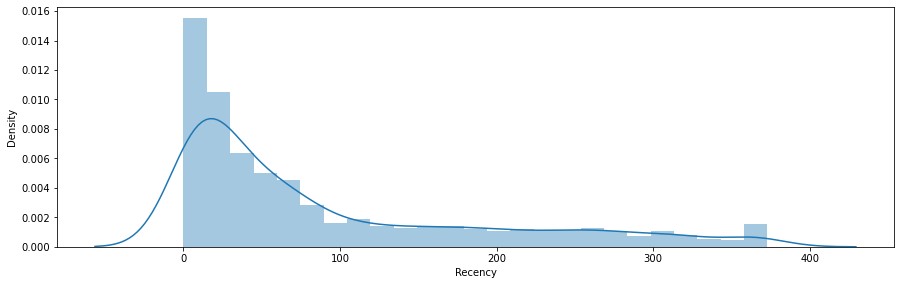

In [43]:

plt.figure(figsize=(15,15))
plt.subplot(3,1,1)
sns.distplot(rfm['Recency'])
plt.show()

FREQUENCY:

/Users/mariapintosrelat/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



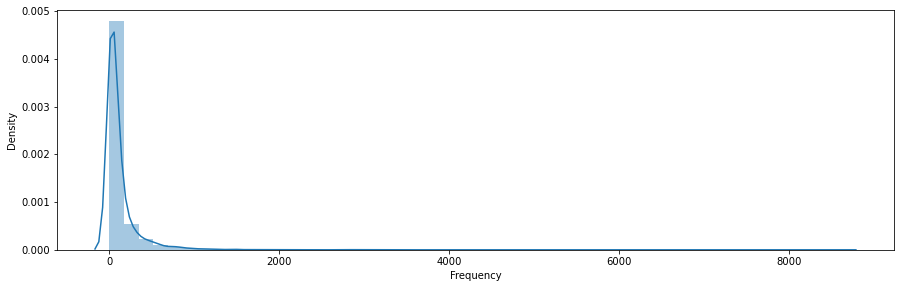

In [44]:

plt.figure(figsize=(15,15))
plt.subplot(3,1,3)
sns.distplot(rfm['Frequency'])
plt.show()

MONETARY AMOUNT:

/Users/mariapintosrelat/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



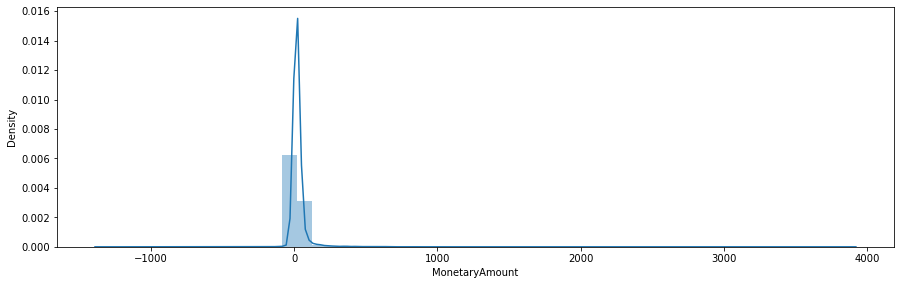

In [45]:
plt.figure(figsize=(15,15))
plt.subplot(3,1,3)
sns.distplot(rfm['MonetaryAmount'])
plt.show()

Given the difference in the ranges of the distribution for the RFM variables, we will proceed to apply a log transformation (for solving skewness) and then, standarizing, after processing outliers.

### OUTLIERS PROCESSING

In [46]:
# Checking the distribution for the RFM variables 
trace1 = go.Box(x=rfm['MonetaryAmount'],name='MonetaryAmount')
trace2 = go.Box(x=rfm['Frequency'], name='Frequency')
trace3 = go.Box(x=rfm['Recency'], name='Recency')


fig = make_subplots(rows=8, cols=1)
fig.append_trace(trace1, row = 1, col = 1)
fig.append_trace(trace2, row = 2, col = 1)
fig.append_trace(trace3, row = 3, col = 1)

fig.update_layout(
    autosize=False,
    width=700,
    height=400,
    title_text = 'Distribution of RFM variables',
    title_x=0.5,
    title_font_size=20)

fig.show()

/Users/mariapintosrelat/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/mariapintosrelat/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/Users/mariapintosrelat/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



The number of outliers for each varaible are: 
Recency: 0
Frequency: 45
MonetaryAmount: 38


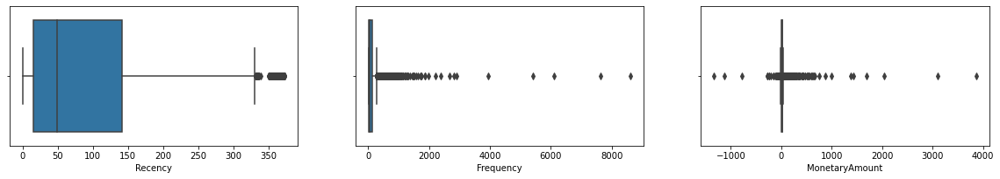

In [48]:
# Checking for outliers
outliers = check_outliers_std_dev(rfm, ["CustomerID"])[0]
outliers_printer(rfm, outliers.keys())

print("The number of outliers for each varaible are: ")
for value in outliers.keys():
    print(value + ": " + str(outliers[value]["quantity"]))

In [49]:
# Removing outliers

rfm_clean = check_outliers_std_dev(rfm, ["CustomerID"])[1]
rfm_clean

,CustomerID,Recency,Frequency,MonetaryAmount
0,12346.0,325,2,0.000000
1,12347.0,1,182,23.681319
2,12348.0,74,206,16.341117
3,12349.0,18,73,24.076027
4,12350.0,309,17,19.670588
...,...,...,...,...
4366,18280.0,277,325,25.632523
4367,18281.0,180,7,11.545714
4368,18282.0,7,13,13.584615
4369,18283.0,3,756,2.771005


### Dropping values equal to 0:

In [52]:
rfm_clean = rfm_clean.drop(rfm_clean[rfm_clean["MonetaryAmount"] == 0].index)
rfm_clean = rfm_clean.drop(rfm_clean[rfm_clean["Recency"] == 0].index)
rfm_clean = rfm_clean.drop(rfm_clean[rfm_clean["Frequency"] == 0].index)
rfm_clean

,CustomerID,Recency,Frequency,MonetaryAmount
1,12347.0,1,182,23.681319
2,12348.0,74,206,16.341117
3,12349.0,18,73,24.076027
4,12350.0,309,17,19.670588
5,12352.0,35,255,12.862471
...,...,...,...,...
4366,18280.0,277,325,25.632523
4367,18281.0,180,7,11.545714
4368,18282.0,7,13,13.584615
4369,18283.0,3,756,2.771005


### APPLYING THE LOG TRANSFORMATION

In [53]:
rfm_clean["log_Avg"] = np.log(rfm_clean["MonetaryAmount"])
rfm_clean["log_Rec"] = np.log(rfm_clean["Recency"])
rfm_clean["log_Freq"] = np.log(rfm_clean["Frequency"])

/Users/mariapintosrelat/opt/anaconda3/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning:

invalid value encountered in log

